<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/convVAE_5_2_epoch200.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Thu Mar  9 01:13:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    49W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!git clone https://github.com/LeoTU911/SCC413

Cloning into 'SCC413'...
remote: Enumerating objects: 888, done.
remote: Counting objects: 100% (887/887), done.
remote: Compressing objects: 100% (714/714), done.
remote: Total 888 (delta 167), reused 878 (delta 164), pack-reused 1
Receiving objects: 100% (888/888), 362.21 MiB | 17.73 MiB/s, done.
Resolving deltas: 100% (167/167), done.
Updating files: 100% (801/801), done.


In [ ]:
# mount google drive in order to get pre-trained model
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import tensorflow as tf
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import keras
import cv2
from keras import backend as K
from keras import losses
from keras.layers import Input, Dense, Lambda, Flatten, Reshape
from keras.layers import Conv2D, Conv2DTranspose, Cropping2D, Dropout
from keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Concatenate, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from PIL import Image

In [ ]:
# data enhancement, to get more data for training
# horizontal flip
def imageGeneration1(image, image_path, image_name, iterations):
  image_horizontal = cv2.flip(image, 1)
  names = image_name.split('.')
  fileName = names[0] + '_horizontal' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_horizontal)
# vertical flip
def imageGeneration2(image, image_path, image_name, iterations):
  image_vertical = cv2.flip(image, -1)
  names = image_name.split('.')
  fileName = names[0] + '_vertical' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_vertical)
# horizontal and vertical flip
def imageGeneration3(image, image_path, image_name, iterations):
  image_HorVer_tmp = cv2.flip(image, 1)
  image_HorVer = cv2.flip(image_HorVer_tmp, -1)
  names = image_name.split('.')
  fileName = names[0] + '_HorVer' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_HorVer)
# vertical and horizontal flip
def imageGeneration4(image, image_path, image_name, iterations):
  image_VerHor_tmp = cv2.flip(image, -1)
  image_VerHor = cv2.flip(image_VerHor_tmp, 1)
  names = image_name.split('.')
  fileName = names[0] + '_VerHor' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_VerHor)
# rotate 90 clockwise
def imageGeneration5(image, image_path, image_name, iterations):
  image_rotate1 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate1' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate1) 
# rotate 90 counter-clockwise
def imageGeneration6(image, image_path, image_name, iterations):
  image_rotate2 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate2' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate2)
# main program
def imageGenerationMain(filePath, n_imgGenerate):
  fileNames = list(os.listdir(filePath))
  for i in range(n_imgGenerate):
    for j in range(len(fileNames)):
      fileName = fileNames[j]
      image = cv2.imread(os.path.join(filePath, fileName))
      imageGeneration1(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration2(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration3(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration4(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration5(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration6(image, image_path = filePath, image_name = fileName, iterations = i)
    print('Image generated, times: ', i+1)
  return True

In [ ]:
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
# every generation will create 6*N photos
# for example, N = 88, 4 loops will create 4*6*88+88(origin) = 2200 images
n_imgGenerate = 4

imageGenerationMain(filePath1, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4


True

In [ ]:
imageGenerationMain(filePath2, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4


True

In [ ]:
# transform images to array-type training dataset
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'

# image to data
def img2GSimg(filePath):
  images = []
  fileNames = list(sorted(os.listdir(filePath)))
  for i in range(len(fileNames)):
    fileName = fileNames[i]
    if fileName.endswith('.jpg'):
      img_tmp = Image.open(os.path.join(filePath, fileName))
      img_tmp = img_tmp.resize((128, 128))
      img_array = np.array(img_tmp)
      images.append(img_array)
  return images

# gray image to data, gray images will convert to RGB data
def grayImg2Data(filePath):
  images = []
  fileNames = list(sorted(os.listdir(filePath)))
  for j in range(len(fileNames)):
    fileName = fileNames[j]
    image_gray = cv2.imread(os.path.join(filePath, fileName), 0)
    image_rgb = cv2.cvtColor(image_gray, cv2.COLOR_GRAY2BGR)
    image_rgb_tmp = cv2.resize(image_rgb, (128, 128))
    img_array = np.array(image_rgb_tmp)
    images.append(img_array)
  return images

images  = img2GSimg(filePath1)
images2 = grayImg2Data(filePath2)

x_train = np.array(images).reshape((-1, 128, 128, 3)).astype('float32') / 255.
y_train = np.array(images2).reshape((-1, 128, 128, 3)).astype('float32') / 255.

In [ ]:
print(x_train.shape)
print(y_train.shape)

(2200, 128, 128, 3)
(2200, 128, 128, 3)


In [ ]:
# parameters settings
input_shape = (128, 128, 3)
batch_size = 64
latent_dim = 256
encoder_layers = [64, 128, 256, 512]
decoder_layers = [64, 128, 128, 256, 256, 512, 512]

# Reparameterization
def sampling(args):
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                              mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

# encoder
inputs = Input(shape=input_shape)
x = inputs
for filters in encoder_layers:
    x = Conv2D(filters, kernel_size=3, strides=2, activation='LeakyReLU', padding='same')(x)
    x = BatchNormalization(axis=1)(x)
    x = MaxPooling2D(padding='same')(x)
shape_before_flattening = x.shape[1:]
x = Flatten()(x)
x = Dense(latent_dim, activation='LeakyReLU')(x)

z_mean = Dense(latent_dim, name='z_mean')(x)
z_log_var = Dense(latent_dim, name='z_log_var')(x)
z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

encoder = Model(inputs, [z_mean, z_log_var], name='encoder')

# decoder
latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
x = Dense(np.prod(shape_before_flattening))(latent_inputs)
x = Reshape(shape_before_flattening)(x)
for filters in decoder_layers:
    x = Conv2DTranspose(filters, kernel_size=3, strides=(2,2), activation='LeakyReLU', padding='same')(x)
x = Conv2DTranspose(3, kernel_size=3, activation='sigmoid', padding='same')(x)
decoder = Model(latent_inputs, x, name='decoder')

encoder.summary()
decoder.summary()

# VAE Model
reconstruction = decoder(z)
vae = Model(inputs, reconstruction, name='vae')

# Calculate loss function
reconstruction_loss = K.mean(K.binary_crossentropy(K.flatten(inputs), K.flatten(reconstruction)))
reconstruction_loss *= input_shape[0] * input_shape[1]
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)

# compile model
vae.compile(optimizer='adam')

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   1792        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 64, 64, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                            

In [ ]:
# import the pre-trained model
from keras.models import load_model

model_Path = '/content/model_57.h5'
preTrained_VAE = load_model(model_Path)

# compile model
preTrained_VAE.compile(optimizer='adam')

Epoch 1/200
31/31 [==============================] - 26s 231ms/step - loss: 11187.5840 - val_loss: 10482.7090
Epoch 2/200
31/31 [==============================] - 4s 132ms/step - loss: 10226.1484 - val_loss: 10060.2715
Epoch 3/200
31/31 [==============================] - 4s 126ms/step - loss: 9952.0596 - val_loss: 10187.6152
Epoch 4/200
31/31 [==============================] - 4s 133ms/step - loss: 9573.4951 - val_loss: 9657.0293
Epoch 5/200
31/31 [==============================] - 4s 126ms/step - loss: 9482.7900 - val_loss: 9659.2256
Epoch 6/200
31/31 [==============================] - 4s 133ms/step - loss: 9388.3770 - val_loss: 9455.7578
Epoch 7/200
31/31 [==============================] - 4s 132ms/step - loss: 9283.7480 - val_loss: 9244.3203
Epoch 8/200
31/31 [==============================] - 4s 133ms/step - loss: 9192.7959 - val_loss: 9150.7100
Epoch 9/200
31/31 [==============================] - 4s 126ms/step - loss: 9118.7773 - val_loss: 9177.7598
Epoch 10/200
31/31 [===========

'\n# pre-Trained Model continue training\npreTrained_VAE.fit(x_train, \n    y_train,\n    epochs=100,\n    batch_size=batch_size,\n    shuffle=False,\n    validation_split=0.1,\n    callbacks=[checkPoint]\n    )\n\n# plot\nplt.plot(preTrained_VAE.history.history["loss"])\nplt.plot(preTrained_VAE.history.history["val_loss"])\n'

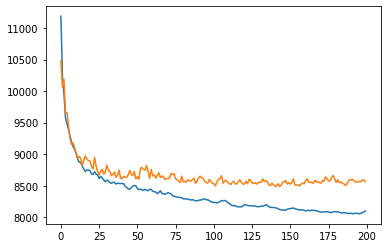

In [ ]:
# train model
checkPointSavedModelName = 'model_{epoch:02d}.h5'
checkPoint = ModelCheckpoint(
    filepath=checkPointSavedModelName,
    monitor='val_loss', 
    save_best_only=True)

vae.fit(x_train, 
    y_train,
    epochs=200,
    batch_size=batch_size,
    shuffle=False,
    validation_split=0.1,
    callbacks=[checkPoint]
    )

# plot
plt.plot(vae.history.history["loss"])
plt.plot(vae.history.history["val_loss"])


"""
# pre-Trained Model continue training
preTrained_VAE.fit(x_train, 
    y_train,
    epochs=100,
    batch_size=batch_size,
    shuffle=False,
    validation_split=0.1,
    callbacks=[checkPoint]
    )

# plot
plt.plot(preTrained_VAE.history.history["loss"])
plt.plot(preTrained_VAE.history.history["val_loss"])
"""

In [ ]:
# save the model to google drive
!cp /content/model_141.h5 /content/drive/MyDrive

In [ ]:
# calculate the MSE and SSIM between the predict image and real image
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

def imgPredictionEvaluate(realImg_array, predictImg_array):

  mse_2img = mean_squared_error(realImg_array, predictImg_array)
  ssim_val_2img = ssim(realImg_array, predictImg_array, multichannel=True)

  evaluations = [round(mse_2img, 4), round(ssim_val_2img, 4)]
  return evaluations

1/1 [==============================] - 1s 522ms/step


<ipython-input-13-996aa01778d8>:9: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_val_2img = ssim(realImg_array, predictImg_array, multichannel=True)


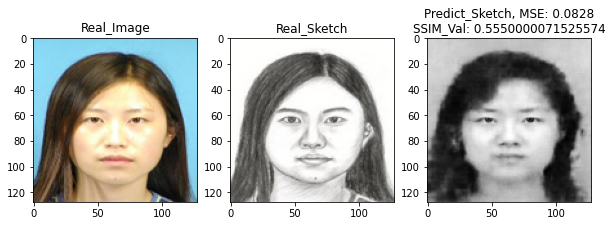

1/1 [==============================] - 0s 24ms/step


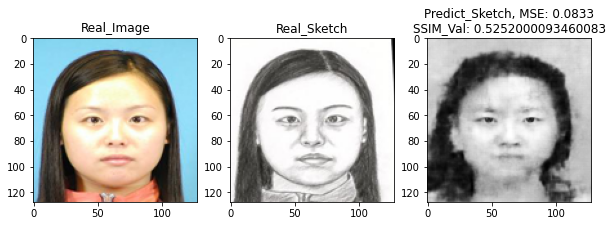

1/1 [==============================] - 0s 23ms/step


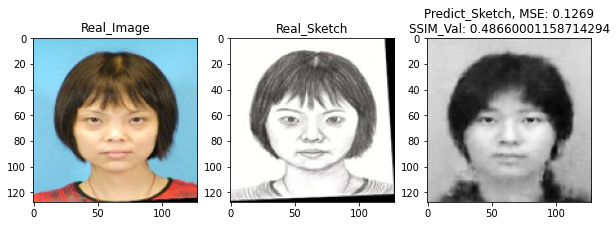

1/1 [==============================] - 0s 23ms/step


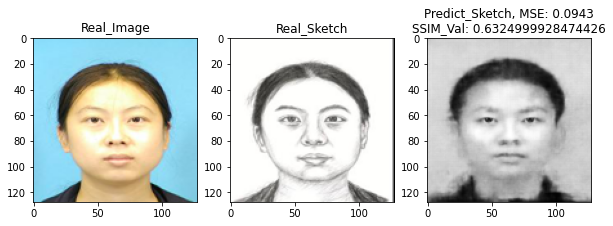

1/1 [==============================] - 0s 24ms/step


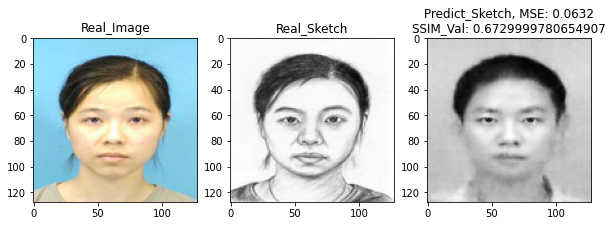

1/1 [==============================] - 0s 23ms/step


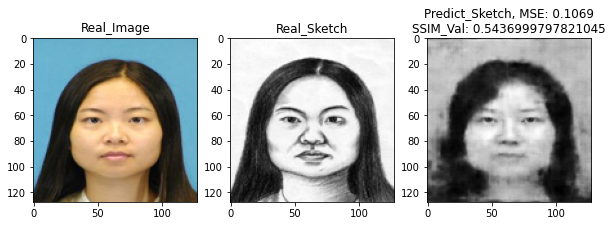

1/1 [==============================] - 0s 23ms/step


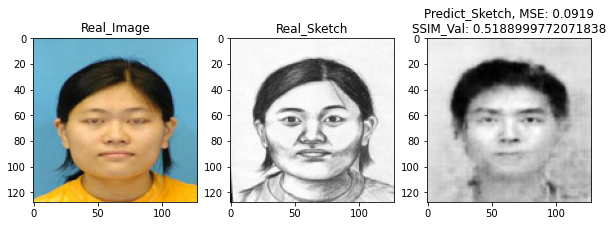

1/1 [==============================] - 0s 23ms/step


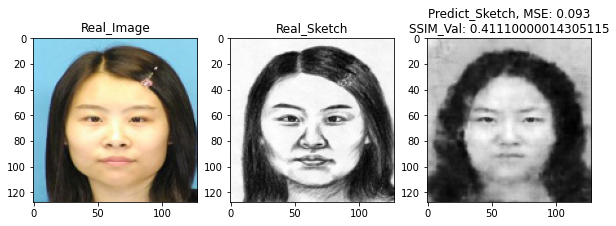

1/1 [==============================] - 0s 22ms/step


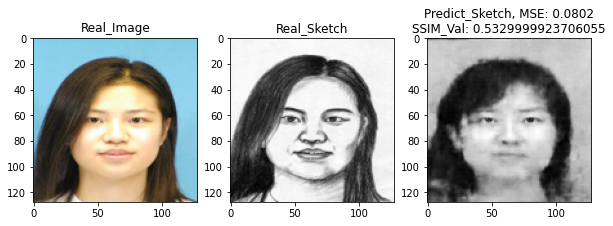

1/1 [==============================] - 0s 24ms/step


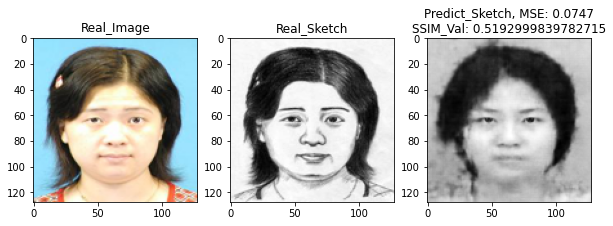

1/1 [==============================] - 0s 23ms/step


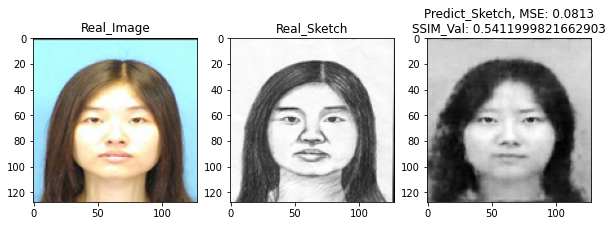

1/1 [==============================] - 0s 23ms/step


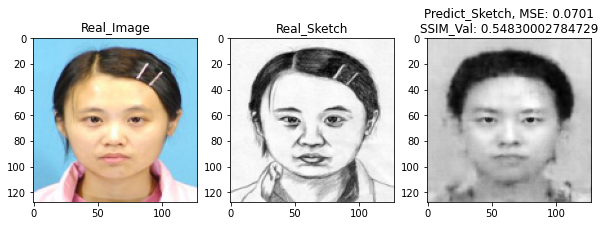

1/1 [==============================] - 0s 23ms/step


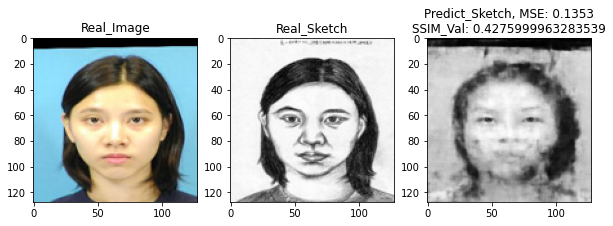

1/1 [==============================] - 0s 22ms/step


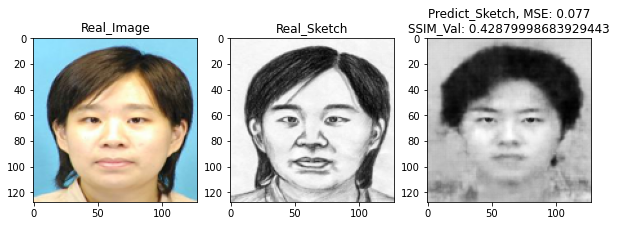

1/1 [==============================] - 0s 23ms/step


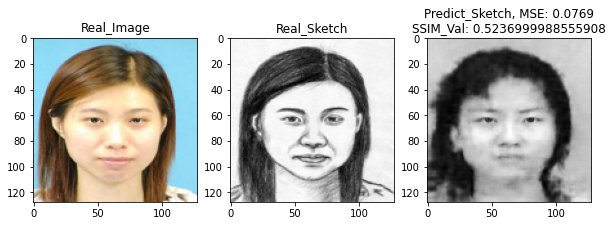

1/1 [==============================] - 0s 23ms/step


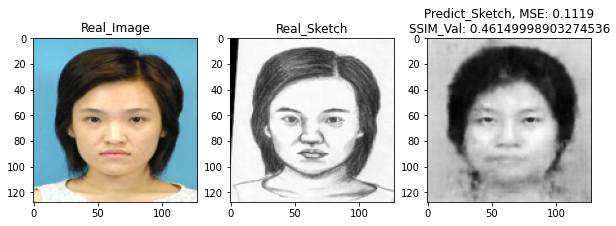

1/1 [==============================] - 0s 24ms/step


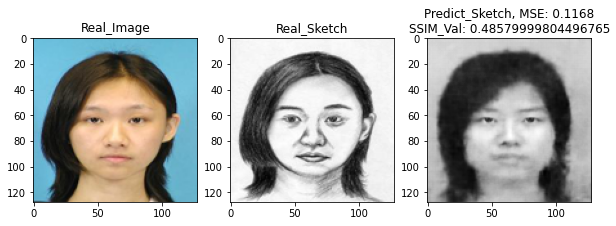

1/1 [==============================] - 0s 24ms/step


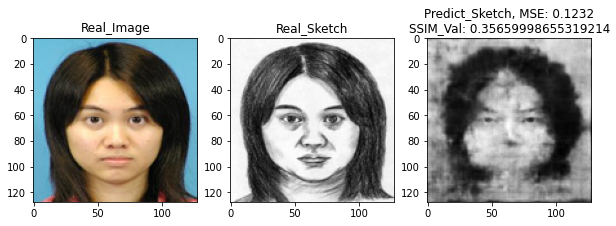

1/1 [==============================] - 0s 24ms/step


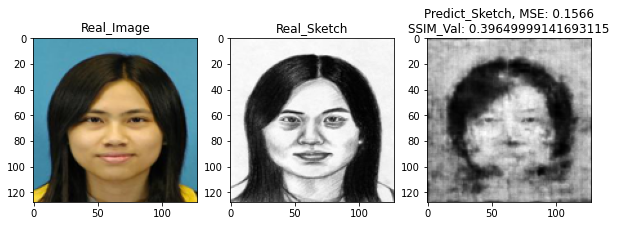

1/1 [==============================] - 0s 24ms/step


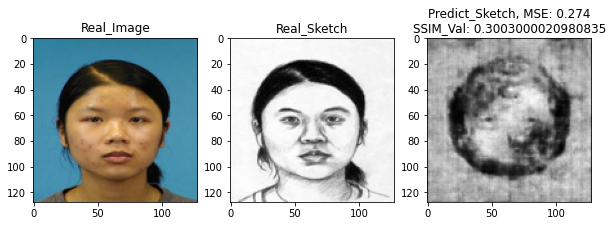

1/1 [==============================] - 0s 23ms/step


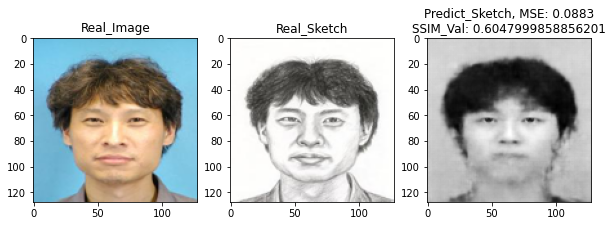

1/1 [==============================] - 0s 23ms/step


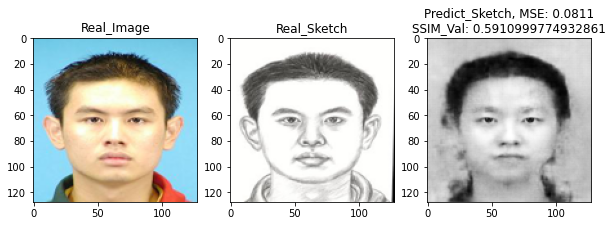

1/1 [==============================] - 0s 23ms/step


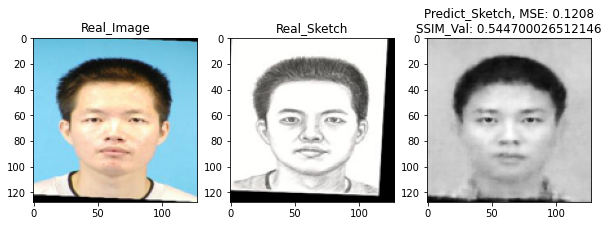

1/1 [==============================] - 0s 24ms/step


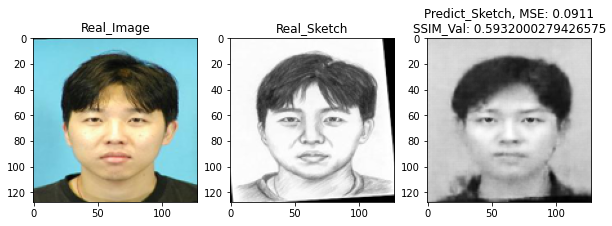

1/1 [==============================] - 0s 23ms/step


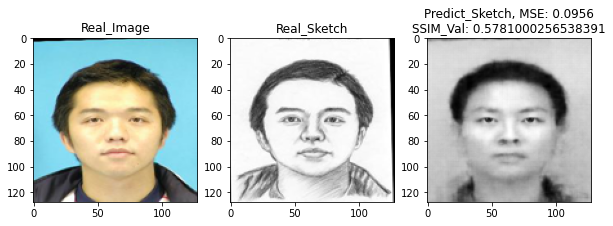

1/1 [==============================] - 0s 23ms/step


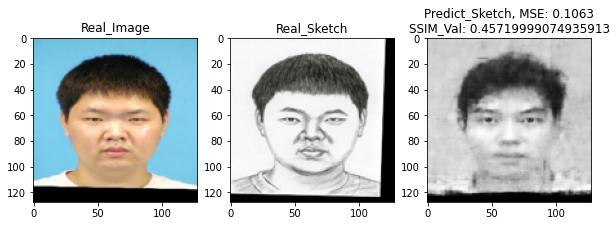

1/1 [==============================] - 0s 23ms/step


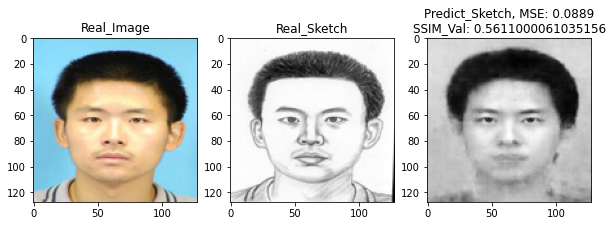

1/1 [==============================] - 0s 22ms/step


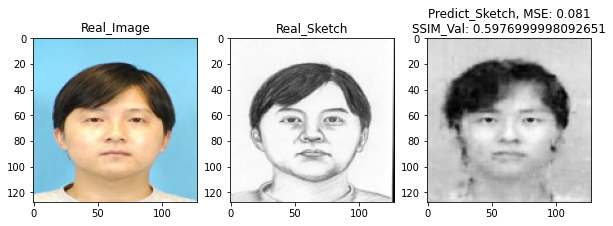

1/1 [==============================] - 0s 23ms/step


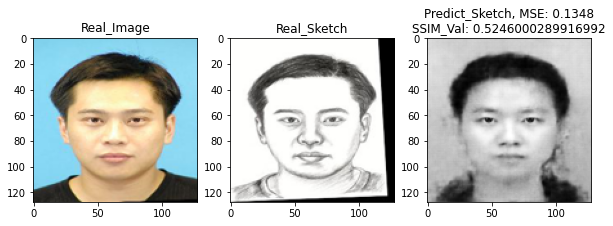

1/1 [==============================] - 0s 23ms/step


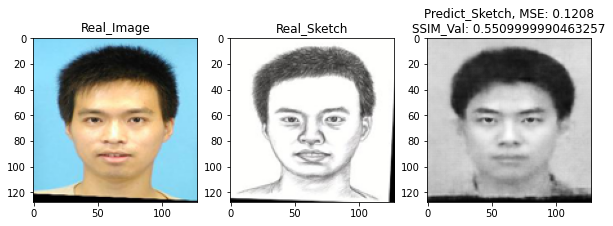

1/1 [==============================] - 0s 24ms/step


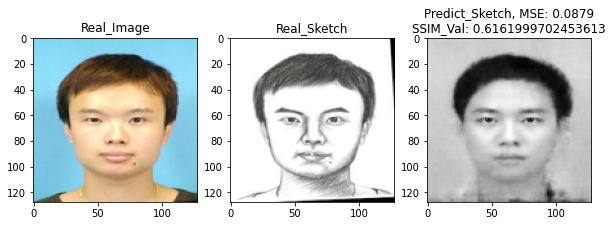

1/1 [==============================] - 0s 26ms/step


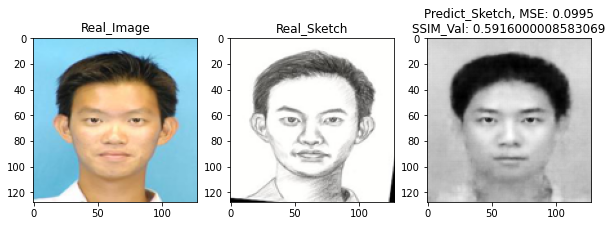

1/1 [==============================] - 0s 23ms/step


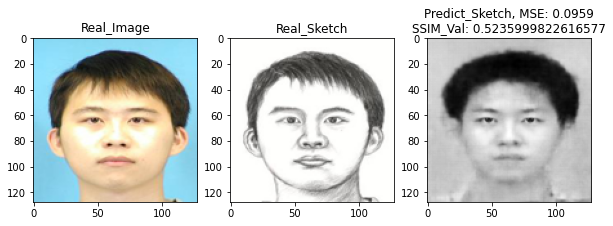

1/1 [==============================] - 0s 24ms/step


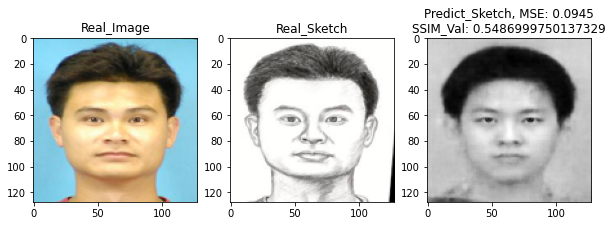

1/1 [==============================] - 0s 23ms/step


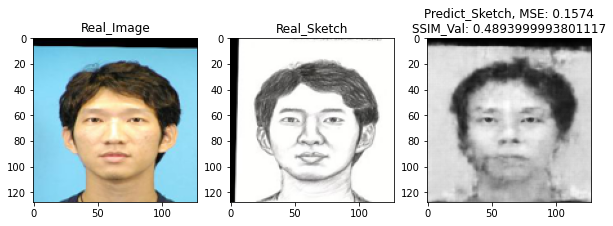

1/1 [==============================] - 0s 23ms/step


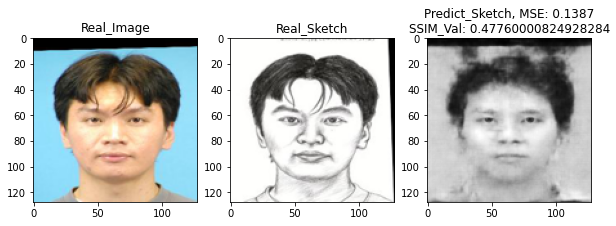

1/1 [==============================] - 0s 23ms/step


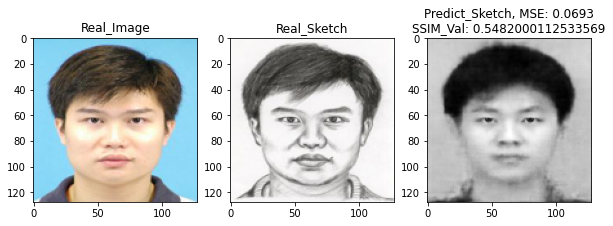

1/1 [==============================] - 0s 23ms/step


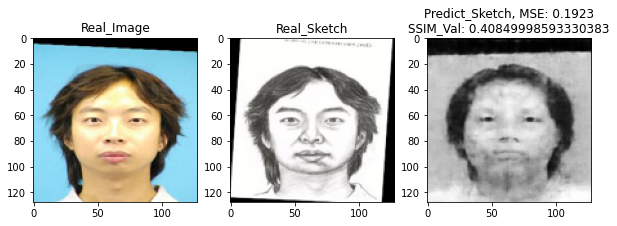

1/1 [==============================] - 0s 24ms/step


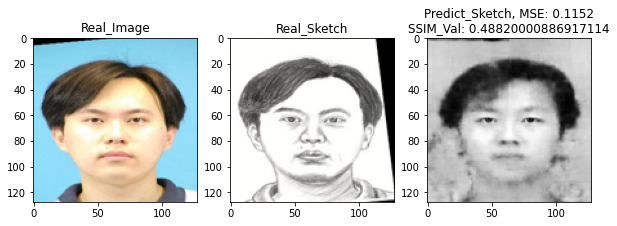

1/1 [==============================] - 0s 23ms/step


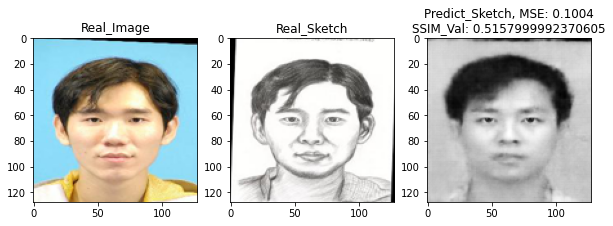

1/1 [==============================] - 0s 25ms/step


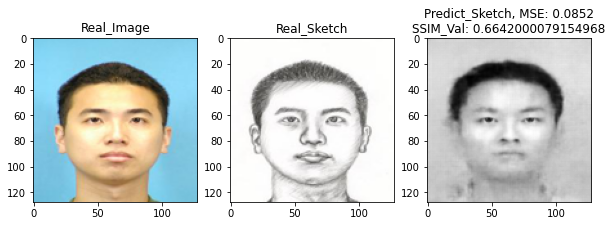

1/1 [==============================] - 0s 23ms/step


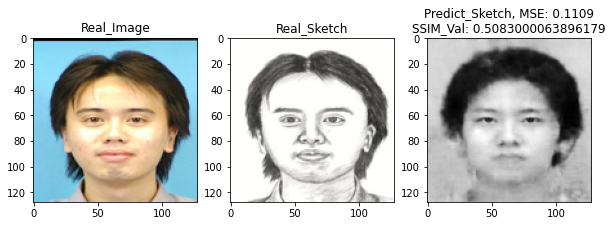

1/1 [==============================] - 0s 23ms/step


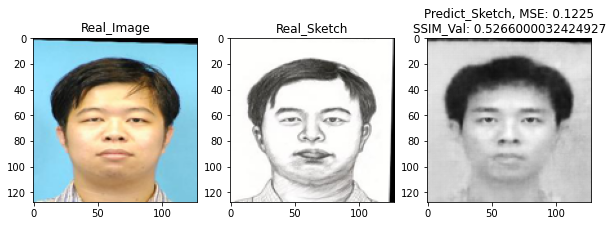

1/1 [==============================] - 0s 23ms/step


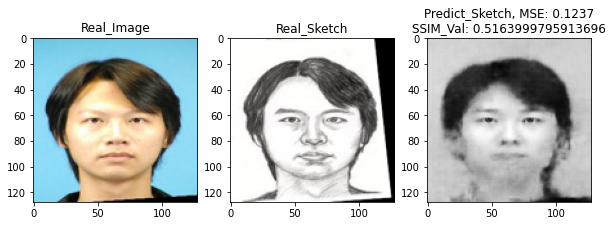

1/1 [==============================] - 0s 24ms/step


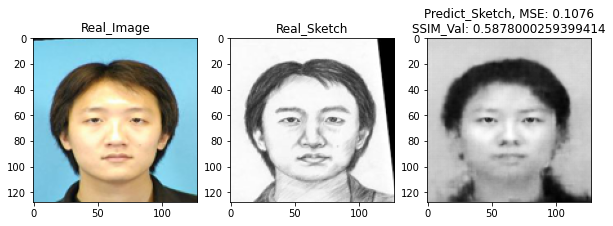

1/1 [==============================] - 0s 24ms/step


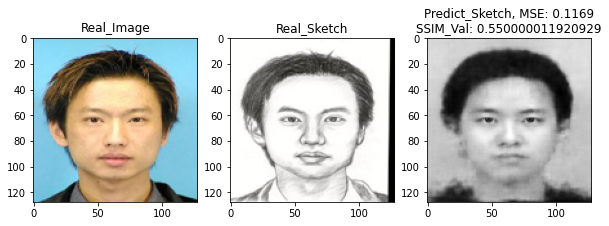

1/1 [==============================] - 0s 24ms/step


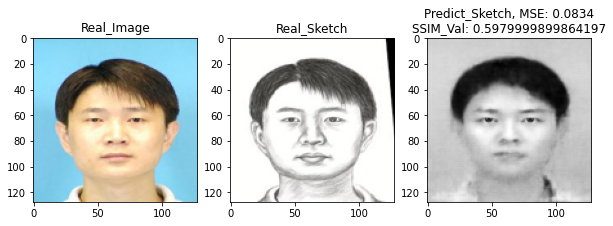

1/1 [==============================] - 0s 23ms/step


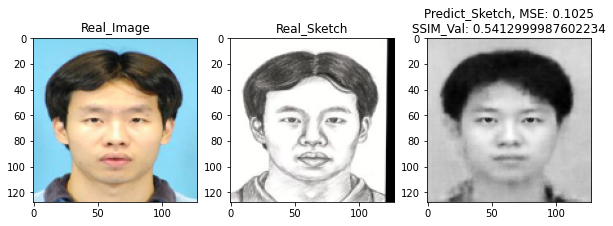

1/1 [==============================] - 0s 23ms/step


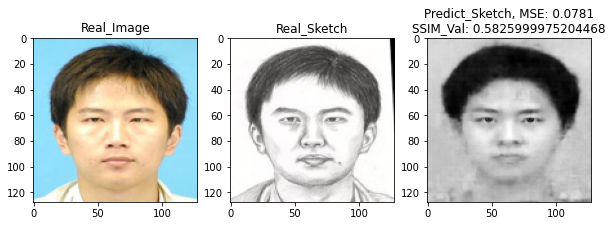

1/1 [==============================] - 0s 23ms/step


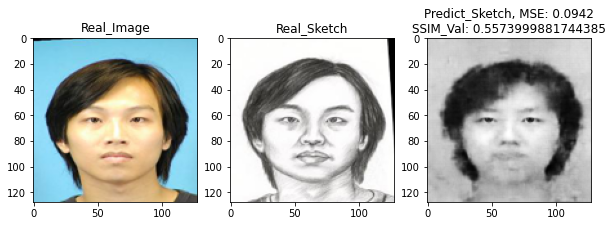

1/1 [==============================] - 0s 24ms/step


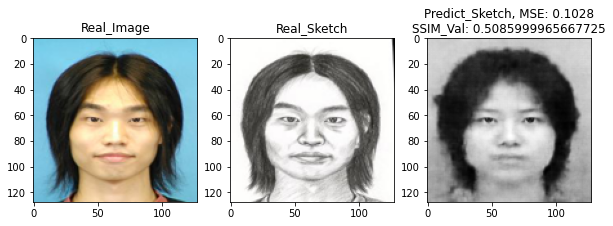

1/1 [==============================] - 0s 23ms/step


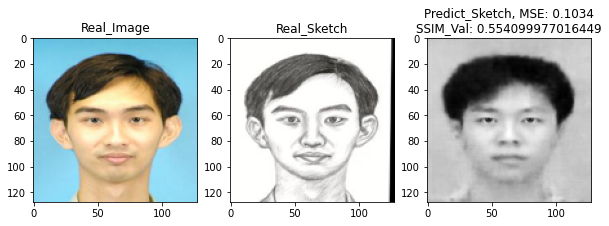

1/1 [==============================] - 0s 24ms/step


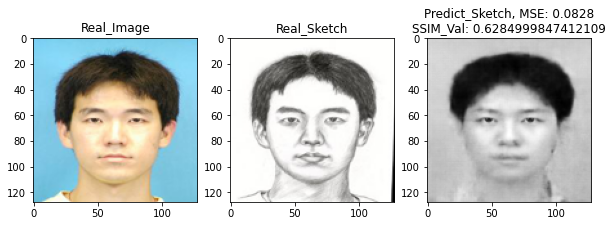

1/1 [==============================] - 0s 24ms/step


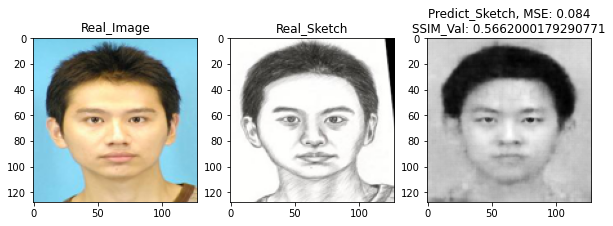

1/1 [==============================] - 0s 24ms/step


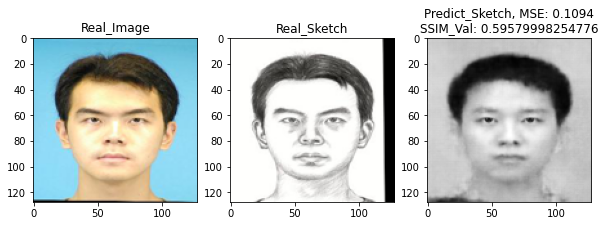

1/1 [==============================] - 0s 24ms/step


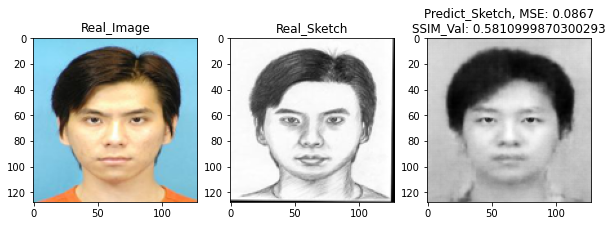

1/1 [==============================] - 0s 22ms/step


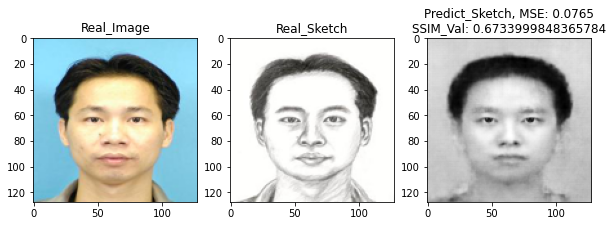

1/1 [==============================] - 0s 22ms/step


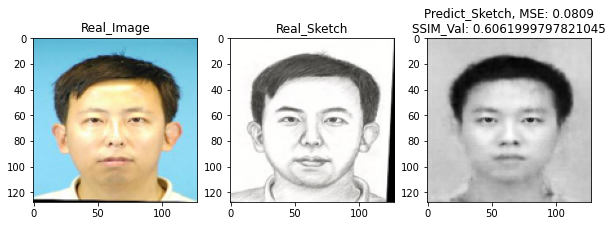

1/1 [==============================] - 0s 25ms/step


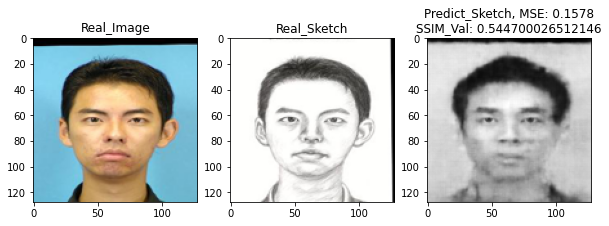

1/1 [==============================] - 0s 24ms/step


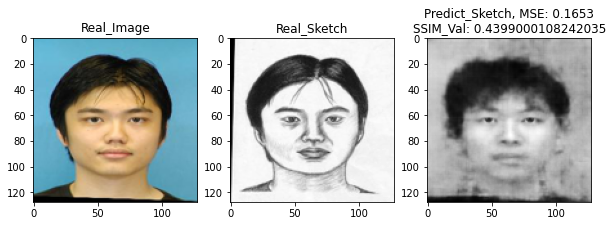

1/1 [==============================] - 0s 24ms/step


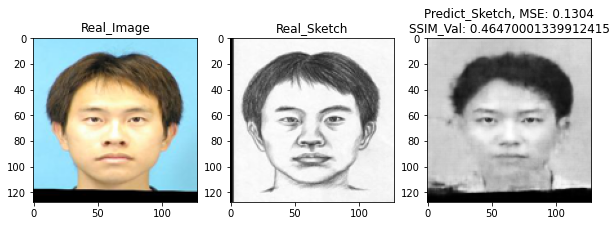

1/1 [==============================] - 0s 24ms/step


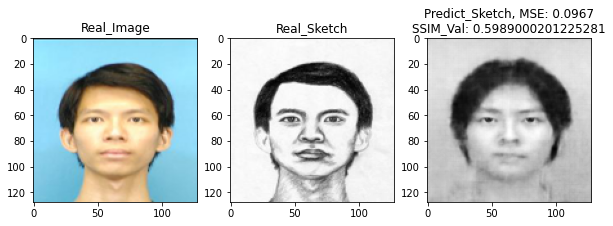

1/1 [==============================] - 0s 28ms/step


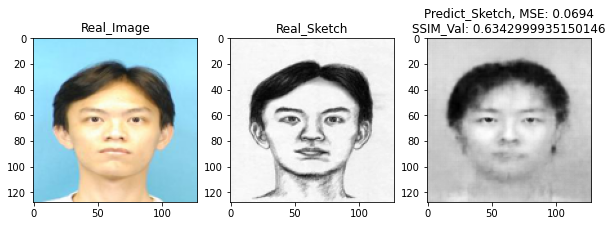

1/1 [==============================] - 0s 23ms/step


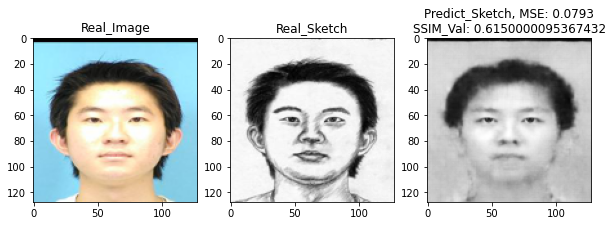

1/1 [==============================] - 0s 24ms/step


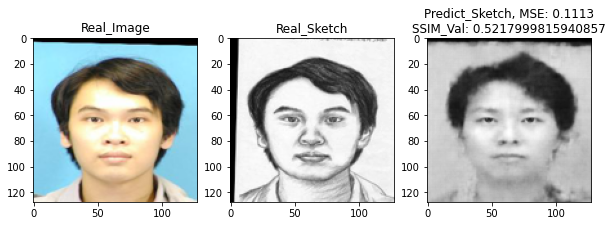

1/1 [==============================] - 0s 23ms/step


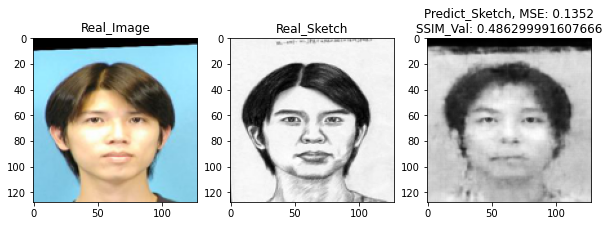

1/1 [==============================] - 0s 22ms/step


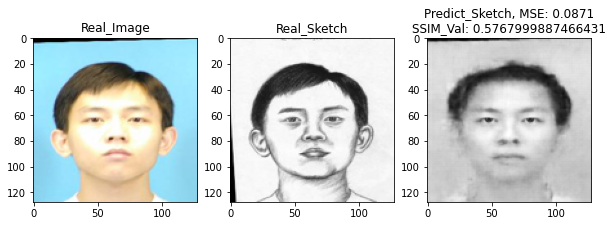

1/1 [==============================] - 0s 23ms/step


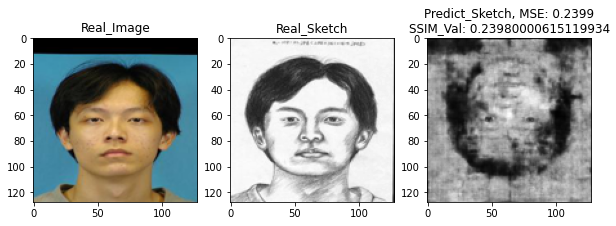

1/1 [==============================] - 0s 23ms/step


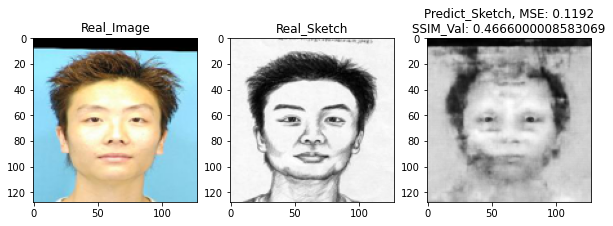

1/1 [==============================] - 0s 22ms/step


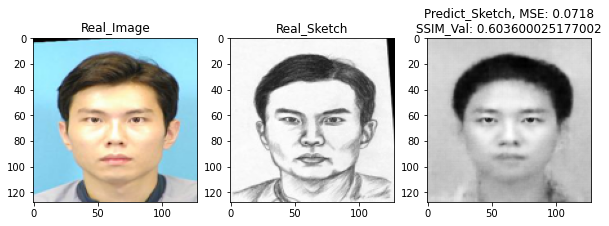

1/1 [==============================] - 0s 23ms/step


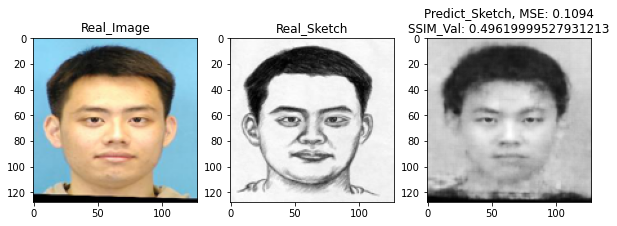

1/1 [==============================] - 0s 23ms/step


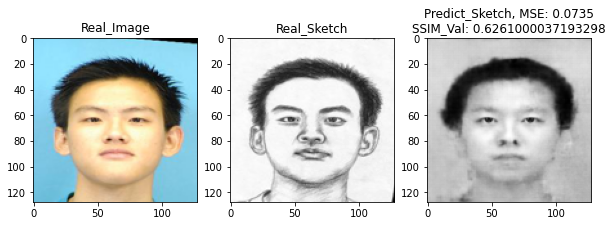

1/1 [==============================] - 0s 23ms/step


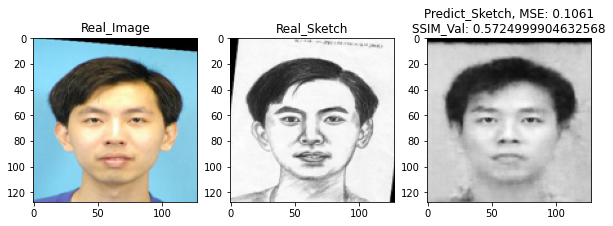

1/1 [==============================] - 0s 24ms/step


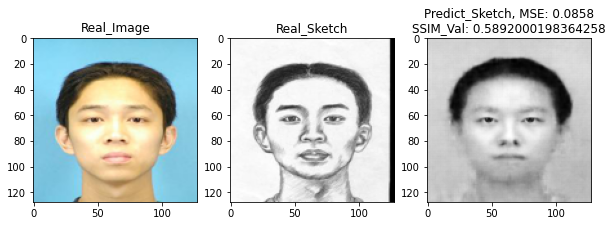

1/1 [==============================] - 0s 23ms/step


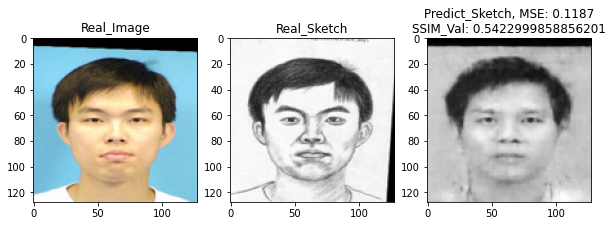

1/1 [==============================] - 0s 24ms/step


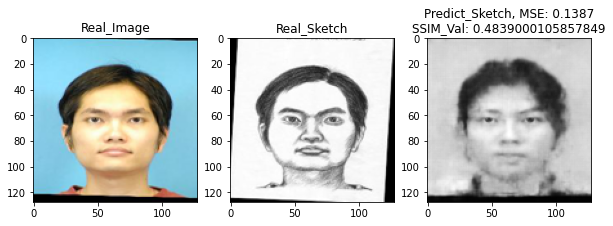

1/1 [==============================] - 0s 22ms/step


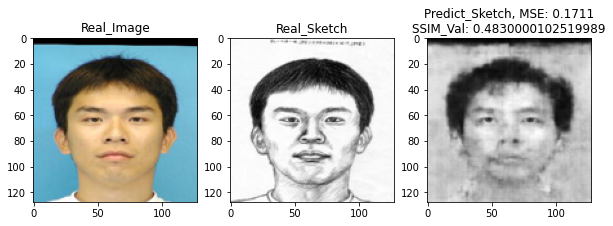

1/1 [==============================] - 0s 23ms/step


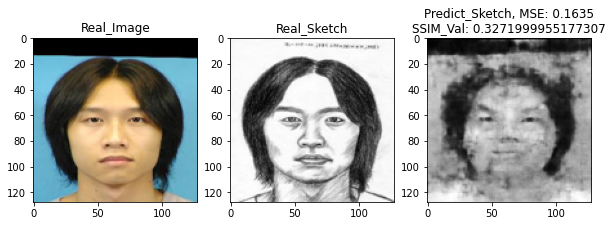

1/1 [==============================] - 0s 23ms/step


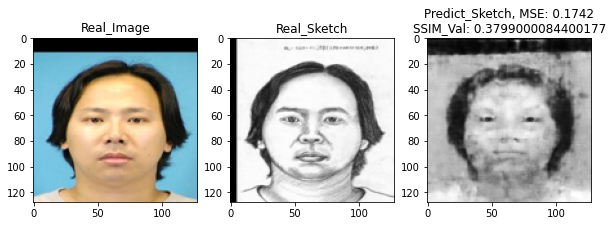

1/1 [==============================] - 0s 23ms/step


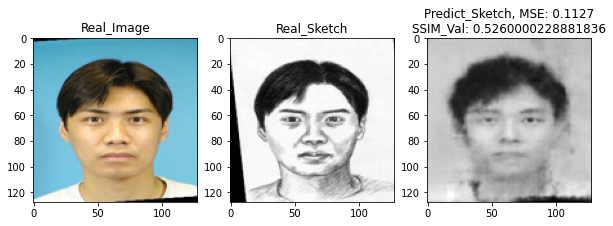

1/1 [==============================] - 0s 23ms/step


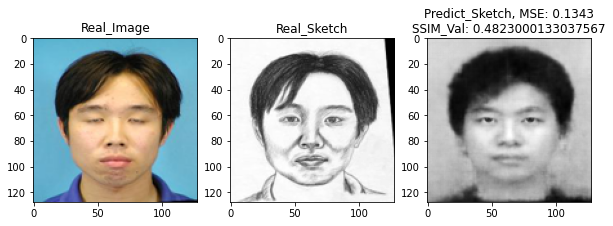

1/1 [==============================] - 0s 23ms/step


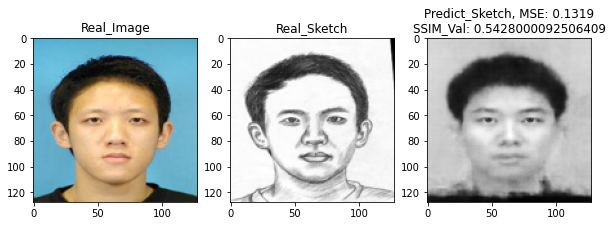

1/1 [==============================] - 0s 23ms/step


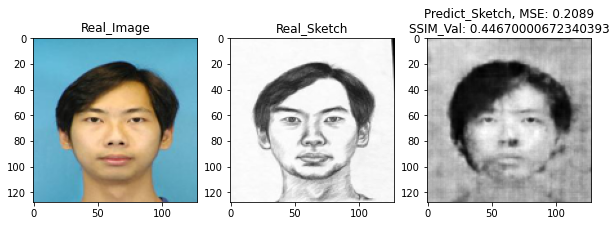

1/1 [==============================] - 0s 23ms/step


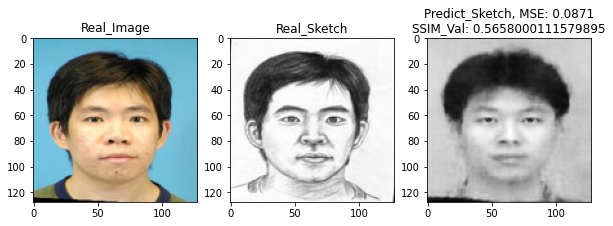

1/1 [==============================] - 0s 23ms/step


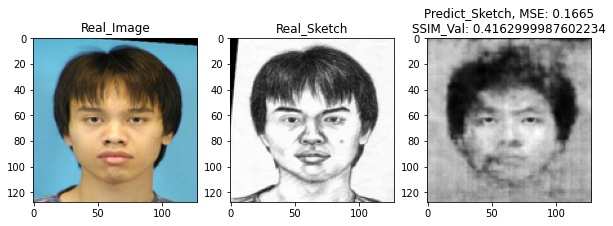

1/1 [==============================] - 0s 24ms/step


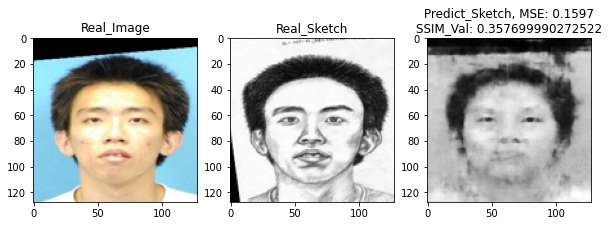

1/1 [==============================] - 0s 29ms/step


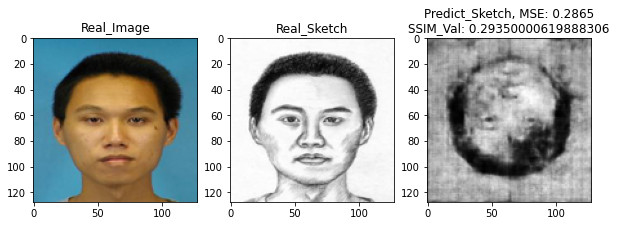

1/1 [==============================] - 0s 24ms/step


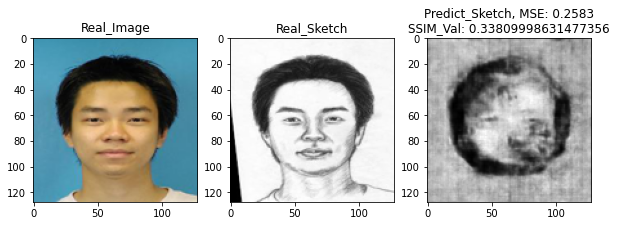

1/1 [==============================] - 0s 24ms/step


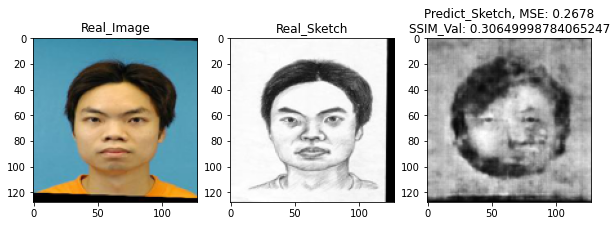

1/1 [==============================] - 0s 25ms/step


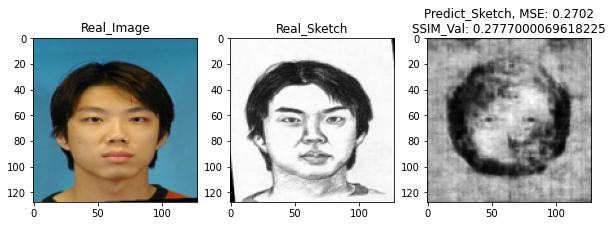

1/1 [==============================] - 0s 23ms/step


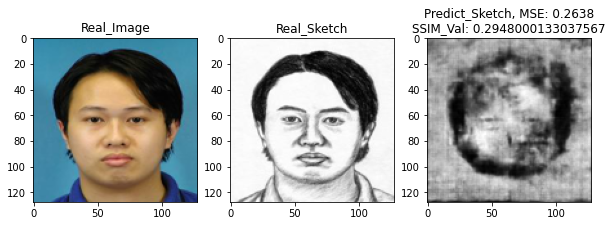

1/1 [==============================] - 0s 23ms/step


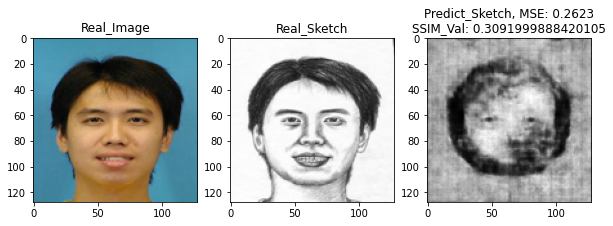

1/1 [==============================] - 0s 23ms/step


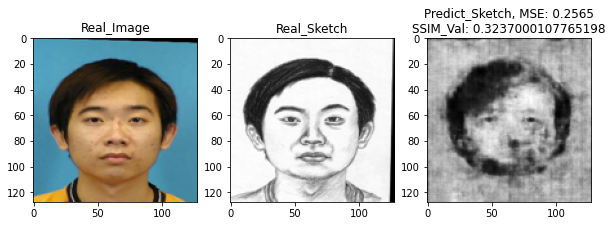

1/1 [==============================] - 0s 22ms/step


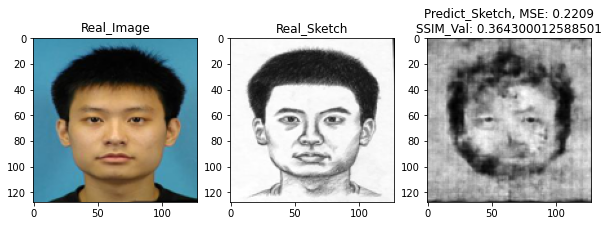

1/1 [==============================] - 0s 23ms/step


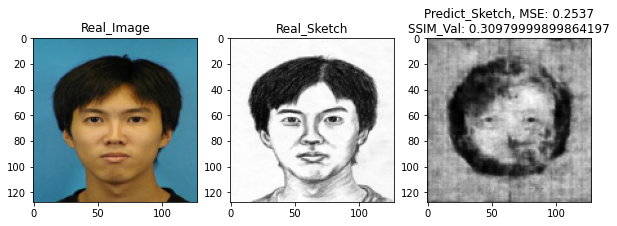

1/1 [==============================] - 0s 23ms/step


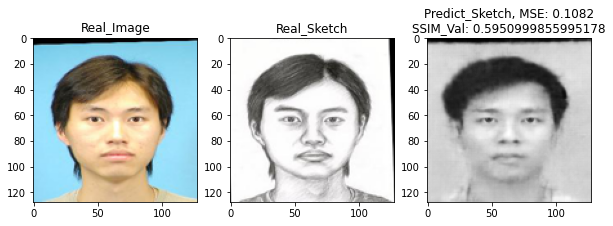

1/1 [==============================] - 0s 26ms/step


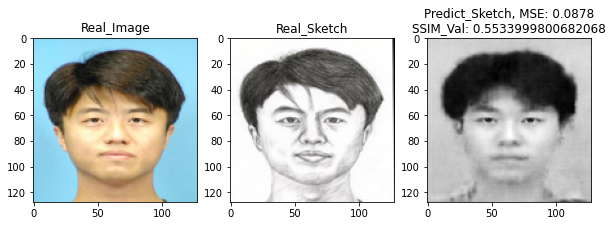

1/1 [==============================] - 0s 23ms/step


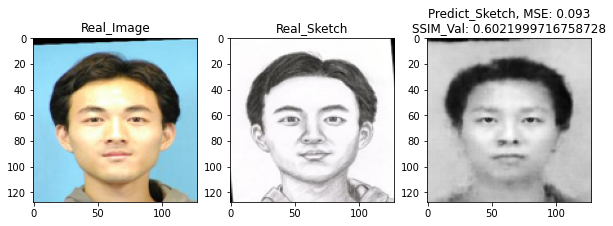

1/1 [==============================] - 0s 23ms/step


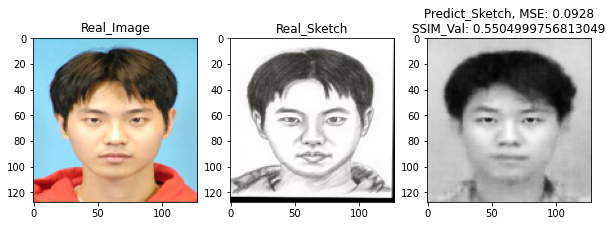

1/1 [==============================] - 0s 23ms/step


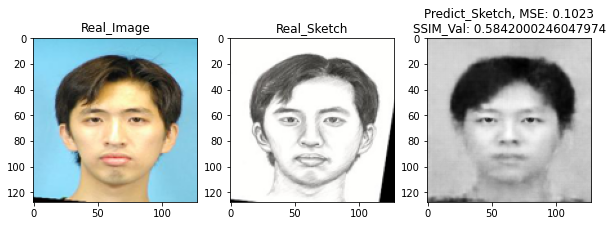

The overall MSE analysis of test dataset: Mean:0.1246, Max:0.2865, Min:0.0632
The overall SSIM_Val analysis of test dataset: Mean:0.5076000094413757, Max:0.6733999848365784, Min:0.23980000615119934


In [ ]:
filePath3 = '/content/SCC413/Keras_convVAE_dataset/CUHK_testing_cropped_photos'
filePath4 = '/content/SCC413/Keras_convVAE_dataset/CUHK_testing_cropped_sketches'
# Store all test cases' evaluations
MSE_all = []
SSIM_val_all = []
# Generate sketch pictures using VAE model
testPhotoFiles = list(sorted(os.listdir(filePath3)))
testSketchesFiles = list(sorted(os.listdir(filePath4)))

for i in range(len(testPhotoFiles)):
  fileName_Photo = testPhotoFiles[i]
  fileName_Sketch = testSketchesFiles[i]
  # read input image
  image_tmp = Image.open(os.path.join(filePath3, fileName_Photo))
  sketch_tmp = Image.open(os.path.join(filePath4, fileName_Sketch))
    
  # Convert to the input format of the model
  image_tmp = image_tmp.resize((128, 128))
  img_tmp = np.array(image_tmp).reshape((1,128,128,3)).astype('float32') / 255.
  sketch_tmp = sketch_tmp.resize((128, 128))

  # Determine the number of image channels in the test sketch dataset, and unify it into a 3-channel RGB image
  if len(np.array(sketch_tmp).shape) == 2:
    sketch_array_tmp = np.array(sketch_tmp).reshape((128,128,1)).astype('float32') / 255.
    sketch_array_rgb = cv2.cvtColor(sketch_array_tmp, cv2.COLOR_GRAY2RGB)
  else:
    sketch_array_rgb = np.array(sketch_tmp).reshape((128,128,3)).astype('float32') / 255.

  # Generate sketch pictures using VAE model
  sketch_Predict_img = vae.predict(img_tmp)
  # Generate sketch pictures using pre-trained model
#  sketch_Predict_img = preTrained_VAE.predict(img_tmp)
  sketch_Predict_img = np.clip(sketch_Predict_img, 0.0, 1.0)
  sketch_Predict_img = sketch_Predict_img.reshape(128,128,3)
  sketch_Predict_Image_gray = cv2.cvtColor(sketch_Predict_img, cv2.COLOR_BGR2GRAY)

  # Calculate MSE and SSIM of predict Image
  evaluations_tmp = imgPredictionEvaluate(realImg_array = sketch_array_rgb, predictImg_array = sketch_Predict_img)
  mse_tmp = evaluations_tmp[0]
  ssim_val_tmp = evaluations_tmp[1]
  MSE_all.append(mse_tmp)
  SSIM_val_all.append(ssim_val_tmp)

  # Display the generated sketch image
  plt.figure(figsize = (10,10))

  plt.subplot(1,3,1)
  plt.title('Real_Image')
  plt.imshow(image_tmp)

  plt.subplot(1,3,2)
  plt.title('Real_Sketch')
  plt.imshow(sketch_tmp, cmap = 'gray') 

  plt.subplot(1,3,3)
  name = 'Predict_Sketch, MSE: {}\nSSIM_Val: {}'.format(mse_tmp, ssim_val_tmp)
  plt.title(name)
  plt.imshow(sketch_Predict_Image_gray, cmap = 'gray')
  plt.show()

# calculate the overall MSE & SSIM
MSE_all_Mean = round(np.mean(MSE_all), 4)
MSE_all_Max = np.max(MSE_all)
MSE_all_Min = np.min(MSE_all)

SSIM_val_all_Mean = round(np.mean(SSIM_val_all), 4)
SSIM_val_all_Max = np.max(SSIM_val_all)
SSIM_val_all_Min = np.min(SSIM_val_all) 

print('The overall MSE analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(MSE_all_Mean, MSE_all_Max, MSE_all_Min))
print('The overall SSIM_Val analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(SSIM_val_all_Mean, SSIM_val_all_Max, SSIM_val_all_Min))